Import images in the same directory as this script.

### Import library

In [ ]:
!pip install sewar

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import requests
from io import BytesIO
from PIL import Image
import cv2
from matplotlib.gridspec import GridSpec
import math

### Graph Utils

In [ ]:
def plot_HE_result_ycbcr(image, equalized_image, vertical_lines=None):
    # Convert the original and equalized images from RGB to YCbCr color space using OpenCV
    ycbcr_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    ycbcr_equalized_image = cv2.cvtColor(equalized_image, cv2.COLOR_RGB2YCrCb)

    # Extract the Y channel (luminance) from both images
    Y_original = ycbcr_image[:, :, 0]
    Y_equalized = ycbcr_equalized_image[:, :, 0]

    # Calculate the histogram and CDF for the Y channel of the original image
    hist_original_y, _ = np.histogram(Y_original.flatten(), 256, [0, 256])
    cdf_original_y = hist_original_y.cumsum()
    cdf_original_normalized_y = cdf_original_y * hist_original_y.max() / cdf_original_y.max()

    # Calculate the histogram and CDF for the Y channel of the equalized image
    hist_equalized_y, _ = np.histogram(Y_equalized.flatten(), 256, [0, 256])
    cdf_equalized_y = hist_equalized_y.cumsum()
    cdf_equalized_normalized_y = cdf_equalized_y * hist_equalized_y.max() / cdf_equalized_y.max()

    # Adjust the figure size for a more compact layout
    plt.figure(figsize=(10, 4))  # Further reduced the height to make the plot more compact
    gs = GridSpec(2, 2, height_ratios=[1, 1], width_ratios=[1, 1])  # Equal width ratios for images and histograms

    # Original Image
    plt.subplot(gs[0, 0])
    plt.title('Original Image')
    plt.imshow(image)
    plt.axis('off')

    # Equalized Image
    plt.subplot(gs[0, 1])
    plt.title('Equalized Image')
    plt.imshow(equalized_image)
    plt.axis('off')

    # Histogram and CDF of Y channel (Original Image)
    plt.subplot(gs[1, 0])
    plt.hist(Y_original.ravel(), bins=256, range=[0, 256], color='blue', alpha=0.5, label='Histogram')
    plt.plot(cdf_original_normalized_y, color='gray', label='CDF')
    plt.xlim([0, 256])
    plt.gca().axes.get_yaxis().set_visible(False)  # Hide the y-axis
    plt.legend(loc='upper left')

    # Histogram and CDF of Y channel (Equalized Image)
    plt.subplot(gs[1, 1])
    plt.hist(Y_equalized.ravel(), bins=256, range=[0, 256], color='blue', alpha=0.5, label='Histogram')
    plt.plot(cdf_equalized_normalized_y, color='gray', label='CDF')
    plt.xlim([0, 256])
    plt.gca().axes.get_yaxis().set_visible(False)  # Hide the y-axis

    # Add vertical lines if the list is provided
    if vertical_lines is not None:
        for x_position in vertical_lines:
            plt.axvline(x=x_position, color='red', linestyle='--', label=f'split at {x_position}')

    plt.legend(loc='upper left')

    # Improve layout for compactness
    plt.tight_layout()
    plt.show()


### Metrices

In [ ]:
#Entropy

def calculate_entropy(img):
  entrophies = []
  for i in range(3):
    Y = img[:,:,i]
    hist, _ = np.histogram(Y.flatten(), bins=256, range=(0, 256))
    pdf = hist / hist.sum()
    # Remove zero probabilities to avoid log(0)
    pdf = pdf[pdf > 0]

    # Calculate entropy
    entropy = -np.sum(pdf * np.log2(pdf))
    entrophies.append(entropy)

  return np.mean(entrophies)

In [ ]:
# Contrast
def c_contrast(image):

  image_ycbcr = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
  image = image_ycbcr[:, :, 0]
  image_array = np.array(image)
  norm = image_array/255

  return np.std(norm)

In [ ]:
#VIF

from sewar.full_ref import vifp

In [ ]:
# Brightness

def calculate_absolute_brightness(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    brightness = np.mean(gray_image)
    return brightness

### Initiate result holder

In [ ]:
CCON = {}
ENTR = {}
VIF = {}
BRIG = {}
images_holder = {}

In [ ]:
listNames = ['sample01.jpg', 'sample02.jpeg', 'sample03.jpeg', 'sample04.jpeg', 'sample05.jpeg', 'sample06.jpg', 'sample07.jpg', 'sample08.jpg']
images_holder['Original'] = []
ENTR['Original'] = []
CCON['Original'] = []
BRIG['Original'] = []


for name in listNames:

  # Load the image using OpenCV
  image = cv2.imread('/content/' + name)
  image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  images_holder['Original'].append(image_rgb)
  ENTR['Original'].append(calculate_entropy(image_rgb))
  CCON['Original'].append(c_contrast(image_rgb))
  BRIG['Original'].append(calculate_absolute_brightness(image_rgb))


### Global Histogram Equalization

In [ ]:
def hist_eq(hist, min, max):
    # calculate probability density function (PDF)
    pdf = hist / hist.sum()

    # Function to calculate the cumulative distribution function (CDF) of a hist
    cdf = np.cumsum(pdf)
    cdf_normalized = np.round(cdf * (max - min) + min) # Normalize the CDF to the range [0, 255], general form = Xmin + (Xmax - Xmin)*cdf

    return cdf_normalized.astype(int)


In [ ]:
# Function to apply histogram equalization
def he(image, min, max):
    # Function to collect the histogram of input image
    histogram,_ = np.histogram(image.flatten(), 256, [0, 256])

    cdf_normalized = hist_eq(histogram, 0, 255)

    # Use the normalized CDF as a mapping function to remap the pixel intensities
    equalized_image = np.interp(image.flatten(), range(256), cdf_normalized).reshape(image.shape)

    # Convert to int data type
    return equalized_image.astype(np.uint8)

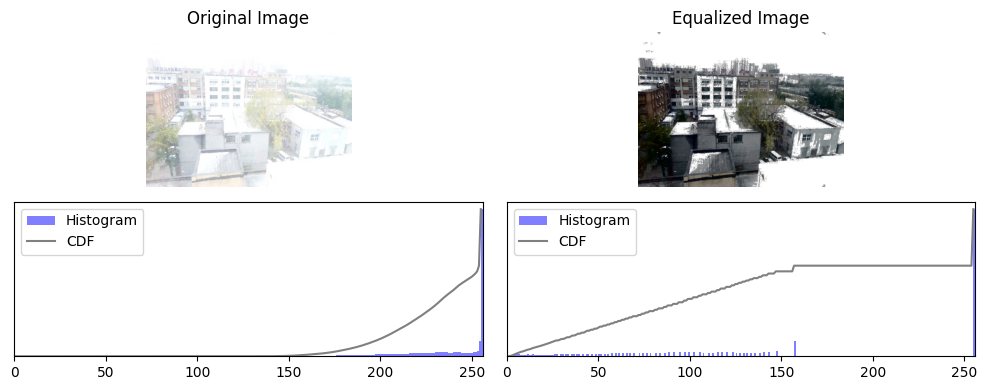

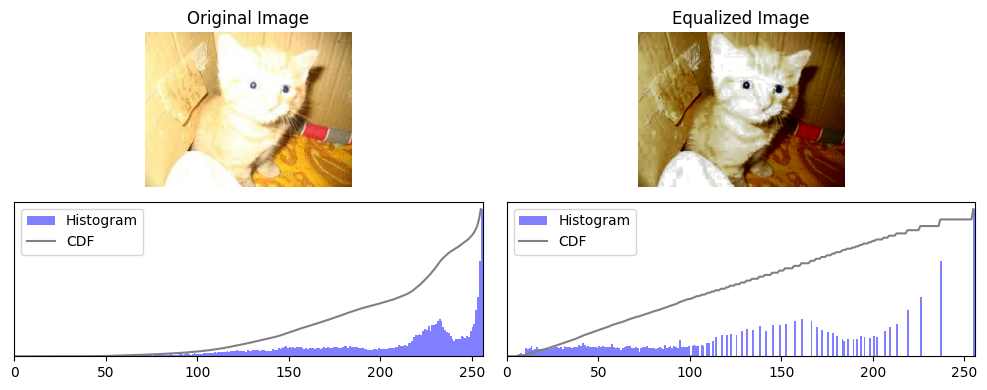

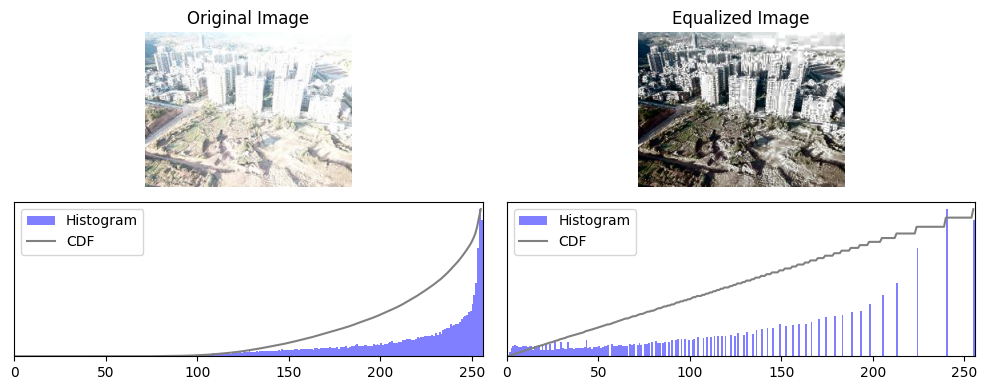

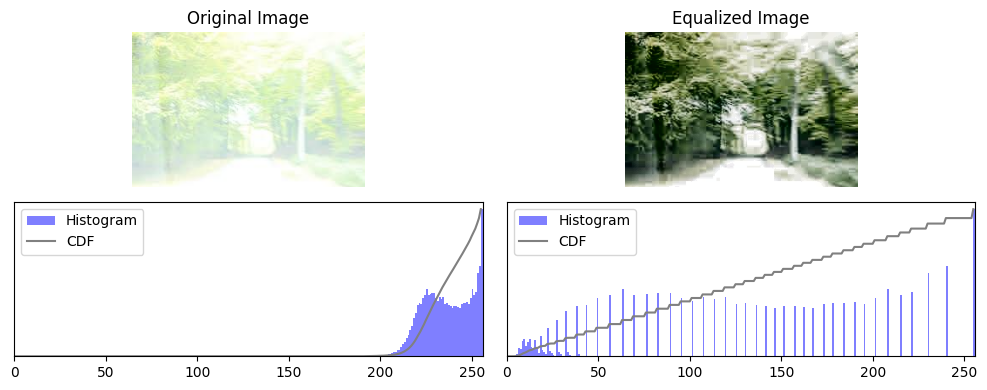

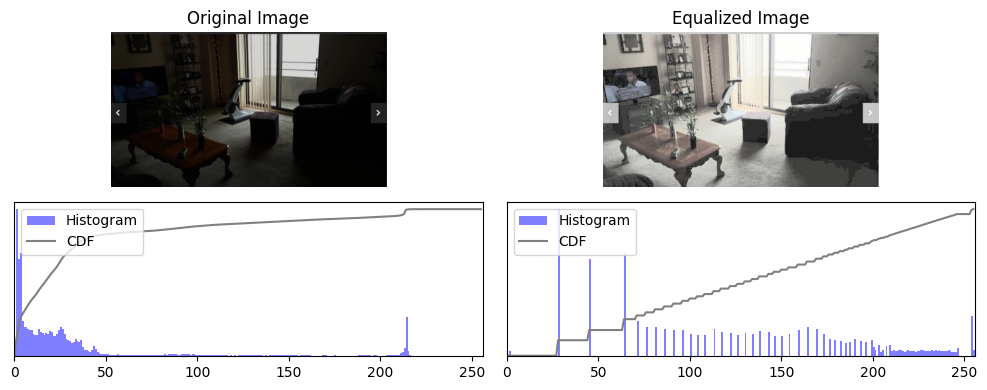

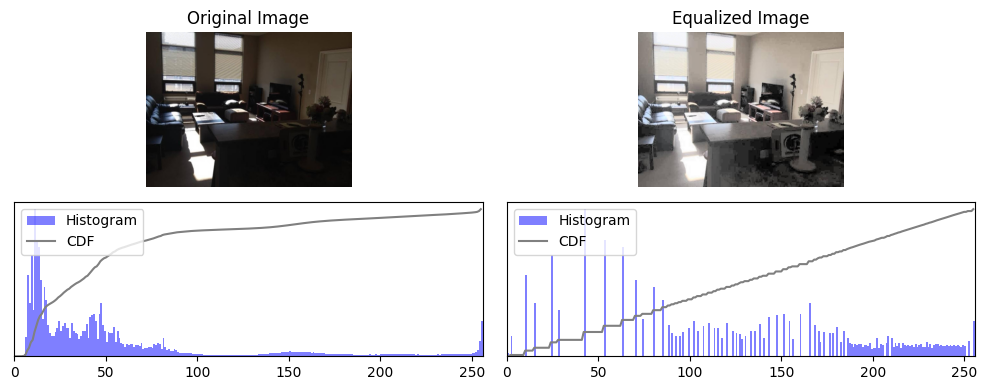

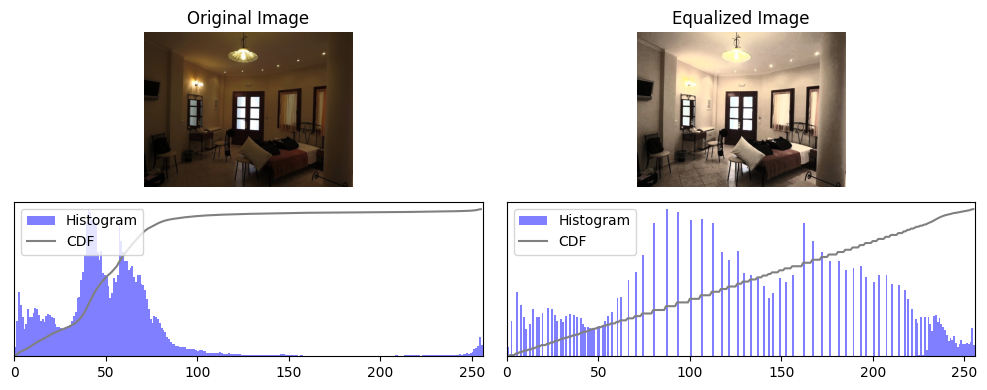

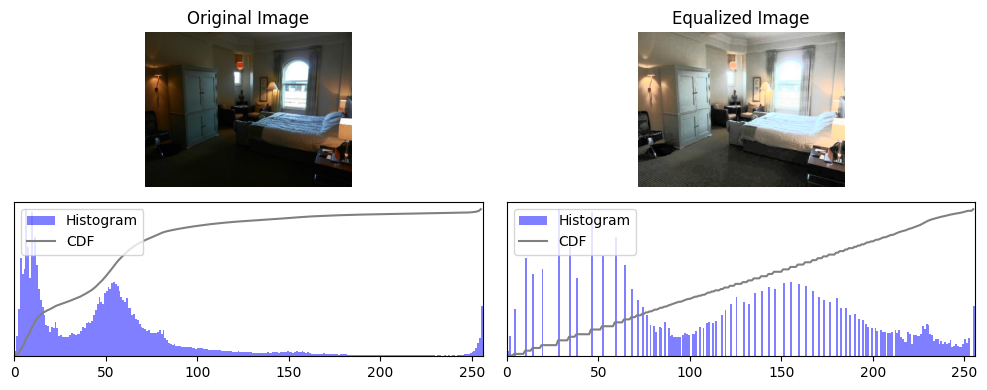

In [ ]:
method = 'HE'

ENTR[method] = []
CCON[method] = []
VIF[method] = []
BRIG[method] = []
images_holder[method] = []

for image in images_holder['Original']:

  # Convert the image from RGB to YCbCr color space using OpenCV
  image_ycbcr = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)

  # equalize the histogram of the Y channel
  image_ycbcr[:, :, 0] = he(image_ycbcr[:, :, 0],0,255)

  # convert equalized image to RGB
  equalized_image = cv2.cvtColor(image_ycbcr, cv2.COLOR_YCrCb2RGB)

  # Plot result
  plot_HE_result_ycbcr(image, equalized_image)

  # Record result
  images_holder[method].append(equalized_image)

  ccon1 = c_contrast(equalized_image)
  CCON[method].append(ccon1)

  ent1 = calculate_entropy(equalized_image)
  ENTR[method].append(ent1)

  vif1 = vifp(image, equalized_image)
  VIF[method].append(vif1)

  brig = calculate_absolute_brightness(equalized_image)
  BRIG[method].append(brig)

### Improvement 1 CLAHE (RM & Tim)

In [ ]:
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))

In [ ]:
method = 'CLAHE'

ENTR[method] = []
CCON[method] = []
VIF[method] = []
BRIG[method] = []
images_holder[method] = []

for image in images_holder['Original']:

  # Convert the image from RGB to YCbCr color space using OpenCV
  image_ycbcr = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)

  # equalize the histogram of the Y channel
  image_ycbcr[:, :, 0] = clahe.apply(image_ycbcr[:, :, 0])

  # convert equalized image to RGB
  equalized_image = cv2.cvtColor(image_ycbcr, cv2.COLOR_YCrCb2RGB)

  # Plot result
  #plot_HE_result_ycbcr(image, equalized_image)

  # Record result
  images_holder[method].append(equalized_image)

  ccon1 = c_contrast(equalized_image)
  CCON[method].append(ccon1)

  ent1 = calculate_entropy(equalized_image)
  ENTR[method].append(ent1)

  vif1 = vifp(image, equalized_image)
  VIF[method].append(vif1)

  brig = calculate_absolute_brightness(equalized_image)
  BRIG[method].append(brig)

###Improvement 2 DHE(Steve & Lehan)


In [ ]:
from scipy.ndimage import gaussian_filter1d
from scipy.signal import argrelextrema
import scipy.signal as signal

def find_local_minimal(image):
  hist, bins = np.histogram(image.flatten(), bins=256, range=[0, 256])

  # Apply Gaussian smoothing
  sigma = 1  # Standard deviation for Gaussian kernel, can be adjusted
  smoothed_hist = gaussian_filter1d(hist, sigma=sigma)

  # Find peaks
  peaks, _ = signal.find_peaks(smoothed_hist, prominence=hist.sum()/200)  # Adjust prominence as needed

  # Find all local minima
  local_minima_indices = signal.argrelmin(smoothed_hist)[0]

  # Find the lowest local minimum before and after each peak
  found_minimal = []

  # Add first nonzero as local minimal
  found_minimal.append(np.nonzero(hist)[0][0])

  for peak in peaks:
      # Minima before the peak
      minima_before = [minima for minima in local_minima_indices if minima < peak]
      # Minima after the peak
      minima_after = [minima for minima in local_minima_indices if minima > peak]

      # Find the lowest minimum before the peak, if any
      if minima_before:
          lowest_before = min(minima_before, key=lambda x: smoothed_hist[x])
          found_minimal.append(lowest_before)

      # Find the lowest minimum after the peak, if any
      if minima_after:
          lowest_after = min(minima_after, key=lambda x: smoothed_hist[x])
          found_minimal.append(lowest_after)

  # Add last nonzero as local minimal
  found_minimal.append(np.nonzero(hist)[0][-1])

  found_minimal = np.unique(found_minimal)

  # Plot the smoothed histogram
  plt.plot(smoothed_hist, label='Smoothed Histogram', color='orange')

  # Plot peaks and the selected lowest local minima
  plt.plot(peaks, smoothed_hist[peaks], "x", label='Peaks', color='blue')
  plt.plot(found_minimal, smoothed_hist[found_minimal], "o", label='Lowest Local Minima', color='red')

  plt.title('Smoothed Histogram with Peaks and Lowest Local Minima')
  plt.xlabel('Intensity Value')
  plt.ylabel('Frequency')
  plt.grid(True)
  plt.legend()
  plt.show()

  return found_minimal

def define_current_and_new_boundary(image, low_minimal):
  print("low_minimal: ", low_minimal)
  if low_minimal[0] != 0:
    low_minimal = np.insert(low_minimal, 0, 0)
  if low_minimal[-1] == 255:
    #low_minimal[-1] = 256
    low_minimal = np.append(low_minimal, 255)
  current_bin = np.diff(low_minimal)

  # Calculate the histogram
  hist, bin_edges = np.histogram(image.flatten(), bins=256, range=[0, 256])

  current_bound = low_minimal

  print("Current Bound: ", current_bound)

  # Find the number of pixels in each bin range
  pixels_in_bins = []
  for i in range(len(current_bound) - 1):
      start, end = current_bound[i], current_bound[i + 1]
      # Sum the pixels in the histogram bins corresponding to the range
      pixels_in_bin = np.sum(hist[start:end])
      pixels_in_bins.append(pixels_in_bin)

  print(hist.sum(), sum)

  # Calculate the natural logarithm of the number of pixels for each segment
  #ln_pixels = np.log(pixels_in_bins)
  pixels_in_bins = np.where(pixels_in_bins == 0, 1e-10, pixels_in_bins)

  # Apply log

  ln_pixels = []

  for j in range(len(pixels_in_bins)):
    if pixels_in_bins[j] == 0:
      ln_pixels.append(0)
    else:
      ln_pixels.append(np.log(pixels_in_bins[j]))

  ln_pixels = np.array(ln_pixels)

  numerator = current_bin * ln_pixels
  print("nume", numerator)
  print(numerator.sum())

  values = np.round((current_bin * ln_pixels / numerator.sum()) * 255)

  new_bound = np.cumsum(np.insert(values, 0, 0))
  print("new bound",  new_bound)

  return current_bound, new_bound

def split_histogram_by_bound(hist, boundaries):
    """
    Splits the histogram based on the given intensity boundaries.
    """
    boundaries[-1] = 256
    segments = []
    for i in range(len(boundaries) - 1):
        start, end = boundaries[i], boundaries[i + 1]
        segments.append(hist[start:end])
        print(f"splitted at:{start, end}")
    return segments

def new_dhe(image, old_bound, new_bound):
    hist, bins = np.histogram(image.flatten(), bins=256, range=[0, 256])
    histograms = split_histogram_by_bound(hist, old_bound)
    len(histograms)
    normalized_cdf = []

    for i, sub_histo in enumerate(histograms):
        # Calculate PDF and CDF for the segment
        pdf = sub_histo / sub_histo.sum()
        cdf = pdf.cumsum()

        print("old len ", len(sub_histo))

        # Determine the range for the current segment
        min_scale = new_bound[i]
        max_scale = new_bound[i + 1]

        print("new len ", max_scale- min_scale)

        # Normalize the CDF to the boundary range [min_scale, max_scale]
        segment_cdf_normalized = np.round(cdf * (max_scale - min_scale) + min_scale).astype(int)

        # Ensure that the CDF values are within the valid range [min_scale, max_scale]
        #segment_cdf_normalized = np.clip(segment_cdf_normalized, min_scale, max_scale)

        # Append the normalized CDF to the overall normalized CDF list
        normalized_cdf.extend(segment_cdf_normalized)

    # Convert the list to an array
    normalized_cdf = np.array(normalized_cdf, dtype=np.uint8)

    #print("len", len(normalized_cdf), normalized_cdf)

    equalized_image = normalized_cdf[image]

    return equalized_image

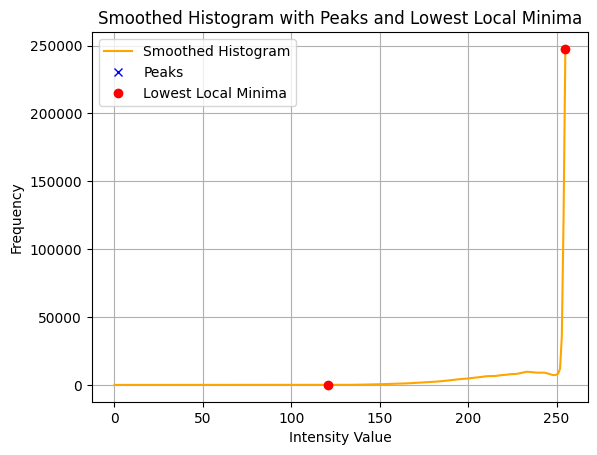

low_minimal:  [121 255]
Current Bound:  [  0 121 255 255]
921600 <built-in function sum>
nume [   0.         1770.84260674    0.        ]
1770.8426067398339
new bound [  0.   0. 255. 255.]
change bound [  0 121 255 255]  to  [  0.   0. 255. 255.]
splitted at:(0, 121)
splitted at:(121, 255)
splitted at:(255, 256)
old len  121
new len  0.0
old len  134
new len  255.0
old len  1
new len  0.0


<ipython-input-133-acaad1013cff>:134: RuntimeWarning: invalid value encountered in divide
  pdf = sub_histo / sub_histo.sum()
<ipython-input-133-acaad1013cff>:146: RuntimeWarning: invalid value encountered in cast
  segment_cdf_normalized = np.round(cdf * (max_scale - min_scale) + min_scale).astype(int)


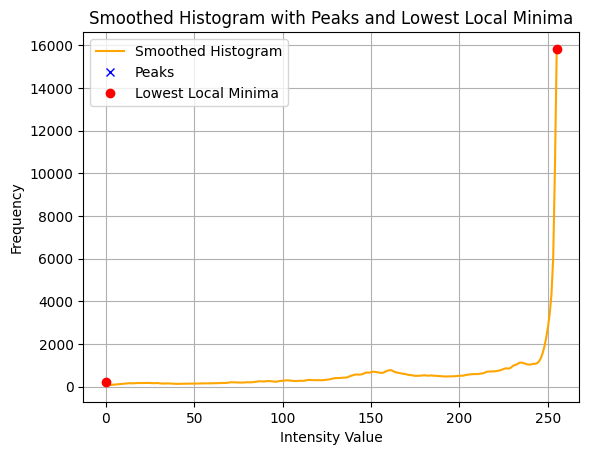

low_minimal:  [  0 255]
Current Bound:  [  0 255 255]
150738 <built-in function sum>
nume [3001.37533671    0.        ]
3001.375336714859
new bound [  0. 255. 255.]
change bound [  0 255 255]  to  [  0. 255. 255.]
splitted at:(0, 255)
splitted at:(255, 256)
old len  255
new len  255.0
old len  1
new len  0.0


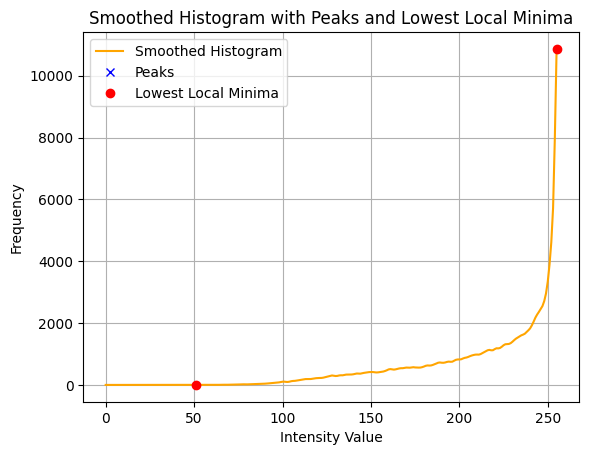

low_minimal:  [ 51 255]
Current Bound:  [  0  51 255 255]
150738 <built-in function sum>
nume [   0.         2412.74051682    0.        ]
2412.7405168150817
new bound [  0.   0. 255. 255.]
change bound [  0  51 255 255]  to  [  0.   0. 255. 255.]
splitted at:(0, 51)
splitted at:(51, 255)
splitted at:(255, 256)
old len  51
new len  0.0
old len  204
new len  255.0
old len  1
new len  0.0


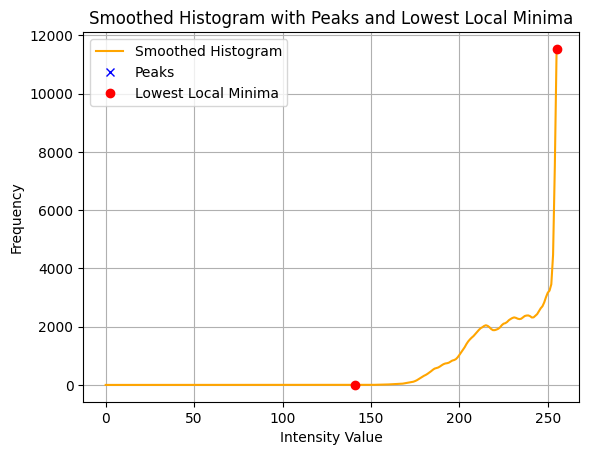

low_minimal:  [141 255]
Current Bound:  [  0 141 255 255]
150975 <built-in function sum>
nume [   0.         1347.02438879    0.        ]
1347.024388785596
new bound [  0.   0. 255. 255.]
change bound [  0 141 255 255]  to  [  0.   0. 255. 255.]
splitted at:(0, 141)
splitted at:(141, 255)
splitted at:(255, 256)
old len  141
new len  0.0
old len  114
new len  255.0
old len  1
new len  0.0


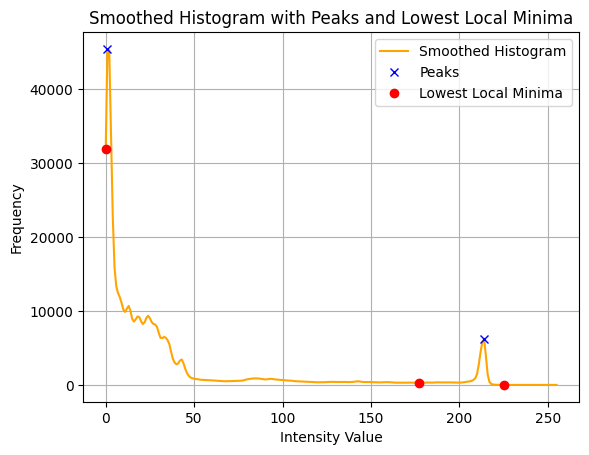

low_minimal:  [  0 177 225]
Current Bound:  [  0 177 225]
606600 <built-in function sum>
nume [2345.07572782  507.52894203]
2852.6046698478476
new bound [  0. 210. 255.]
change bound [  0 177 225]  to  [  0. 210. 255.]
splitted at:(0, 177)
splitted at:(177, 256)
old len  177
new len  210.0
old len  79
new len  45.0


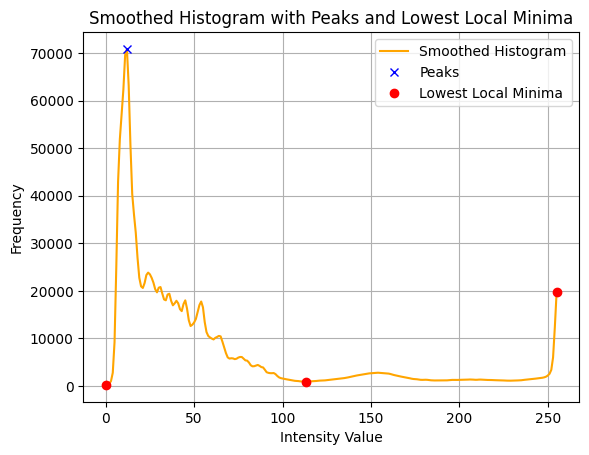

low_minimal:  [  0 113 255]
Current Bound:  [  0 113 255 255]
1864590 <built-in function sum>
nume [1614.5713137  1755.43542858    0.        ]
3370.0067422749016
new bound [  0. 122. 255. 255.]
change bound [  0 113 255 255]  to  [  0. 122. 255. 255.]
splitted at:(0, 113)
splitted at:(113, 255)
splitted at:(255, 256)
old len  113
new len  122.0
old len  142
new len  133.0
old len  1
new len  0.0


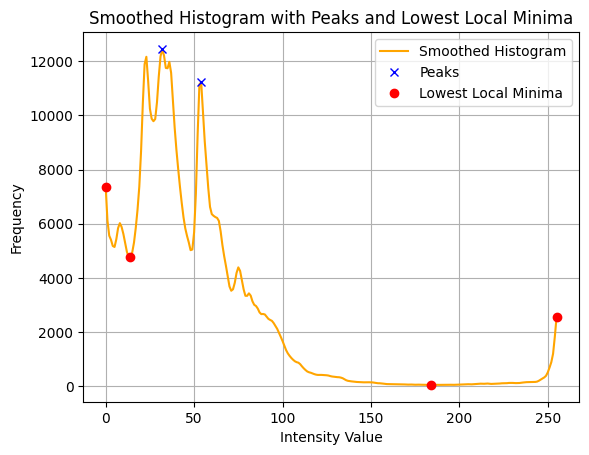

low_minimal:  [  0  14 184 255]
Current Bound:  [  0  14 184 255 255]
673200 <built-in function sum>
nume [ 157.80906521 2255.97425103  664.06071169    0.        ]
3077.8440279226024
new bound [  0.  13. 200. 255. 255.]
change bound [  0  14 184 255 255]  to  [  0.  13. 200. 255. 255.]
splitted at:(0, 14)
splitted at:(14, 184)
splitted at:(184, 255)
splitted at:(255, 256)
old len  14
new len  13.0
old len  170
new len  187.0
old len  71
new len  55.0
old len  1
new len  0.0


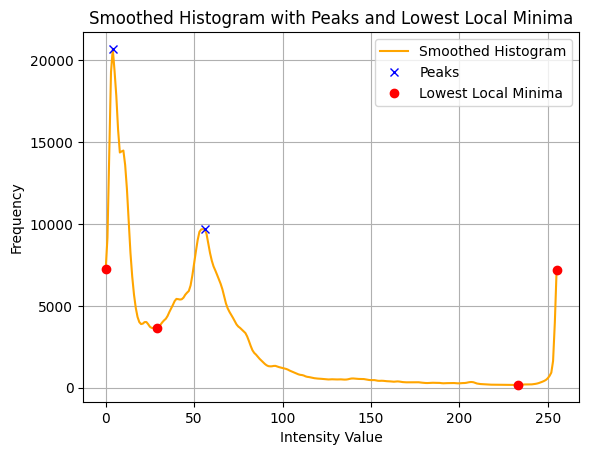

low_minimal:  [  0  29 233 255]
Current Bound:  [  0  29 233 255 255]
679800 <built-in function sum>
nume [ 362.78666993 2626.01587667  199.88255067    0.        ]
3188.685097272767
new bound [  0.  29. 239. 255. 255.]
change bound [  0  29 233 255 255]  to  [  0.  29. 239. 255. 255.]
splitted at:(0, 29)
splitted at:(29, 233)
splitted at:(233, 255)
splitted at:(255, 256)
old len  29
new len  29.0
old len  204
new len  210.0
old len  22
new len  16.0
old len  1
new len  0.0


In [ ]:
method = 'DHE'
ENTR[method] = []
CCON[method] = []
VIF[method] = []
BRIG[method] = []
images_holder[method] = []

for image in images_holder['Original']:

  # Convert the image to LAB color space
  lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

  # Split the LAB image into L, A, and B channels
  l_channel, a_channel, b_channel = cv2.split(lab_image)

  # find local minimal
  local_minimal = find_local_minimal(image)

  # dynamic define the boundary
  old_bound, new_bound = define_current_and_new_boundary(image, local_minimal)

  print("change bound", old_bound, " to ", new_bound)

  equalized_l_channel = new_dhe(l_channel, old_bound, new_bound)

  # Merge the channels back together
  equalized_lab = cv2.merge((equalized_l_channel, a_channel, b_channel))

  # Convert back to RGB color space
  equalized_image = cv2.cvtColor(equalized_lab, cv2.COLOR_LAB2BGR)

  # Plot result
  #plot_HE_result_ycbcr(image, equalized_image)

  # Record result
  images_holder[method].append(equalized_image)

  ccon1 = c_contrast(equalized_image)
  CCON[method].append(ccon1)

  ent1 = calculate_entropy(equalized_image)
  ENTR[method].append(ent1)

  vif1 = vifp(image, equalized_image)
  VIF[method].append(vif1)

  brig = calculate_absolute_brightness(equalized_image)
  BRIG[method].append(brig)

### Improvement 3: HEMIC

In [ ]:
def magnitude_stretching(ori_img):
  img = np.copy(ori_img)

  for i in range(3):
    r_max = img[:,:,i].flatten().max()
    r_min = img[:,:,i].flatten().min()
    img[:,:,i] = (img[:,:,i] - r_min)/(r_max - r_min) *255

  return img

def entropy(img):
  hist, _ = np.histogram(img.flatten(), bins=256, range=(0, 256))
  pdf = hist / hist.sum()
    # Remove zero probabilities to avoid log(0)
  pdf = pdf[pdf > 0]

  # Calculate entropy
  ent = -np.sum(pdf * np.log2(pdf))

  return ent

def golden_search(I_in, I_eq, a_0, b_0, N):
  a_1 = a_0 + 0.61803 * (b_0 - a_0)
  b_1 = a_0 + (1 - 0.61803) * (b_0 - a_0)
  alphas = [a_1, b_1]
  Obj = []

  for alpha in alphas:
    I_enh = (alpha * I_in + (1 - alpha) * I_eq).astype(np.uint8)
    hist, _ = np.histogram(I_enh.flatten(), bins=256, range=(0, 256))
    z_0 = np.sum(hist == 0)
    J = entropy(I_enh) * (1 - z_0/255)
    Obj.append(J)

  print(Obj)
  if N < 2:
    n = np.argmax(Obj)
    alpha =  alphas[n]
    I_enh = (alpha * I_in + (1 - alpha) * I_eq).astype(np.uint8)
    return I_enh, alpha

  if Obj[0] < Obj[1]:
    return golden_search(I_in, I_eq, a_0, b_1, N-1)
  else:
    return golden_search(I_in, I_eq, a_1, b_0, N-1)

In [ ]:
def hemic(ori_img, n):
  img = magnitude_stretching(ori_img)
  img_ycbcr = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
  I_in = img_ycbcr[:,:,0]
  I_eq = he(I_in,0,255)
  #I_enh, alpha = golden_search(I_in, I_eq, 0.2, 0.6, n)
  I_enh, alpha = golden_search(I_in, I_eq, 0, 0.6, n)
  print(f"alpha: {alpha}")
  img_ycbcr[:,:,0] = I_enh
  equalized_image = cv2.cvtColor(img_ycbcr, cv2.COLOR_YCrCb2RGB)
  return equalized_image


[3.6030459179219885, 3.1440244900836403]
[4.094524582845653, 3.7982186178336543]
[4.227032384822086, 4.129147449607657]
[4.326120828538801, 4.273964920212026]
alpha: 0.587227724755327


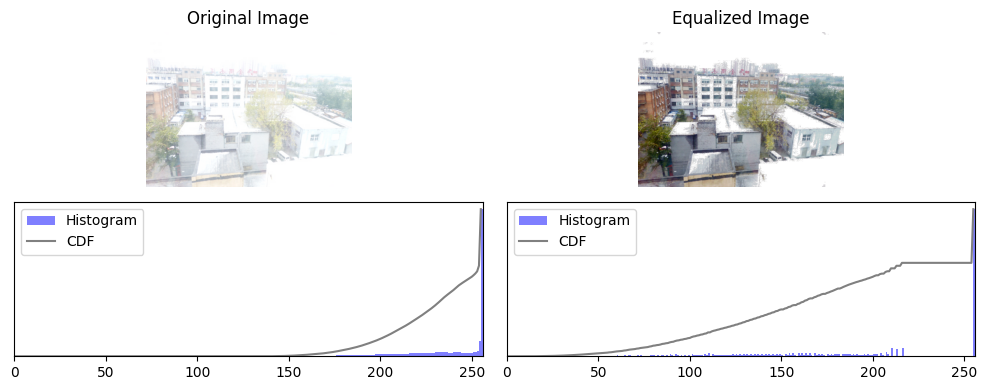

[5.066189787373772, 4.696953721819156]
[5.468884159429276, 5.327979754279518]
[5.613915177633832, 5.585079232211521]
[5.670231087536525, 5.641315121433226]
alpha: 0.587227724755327


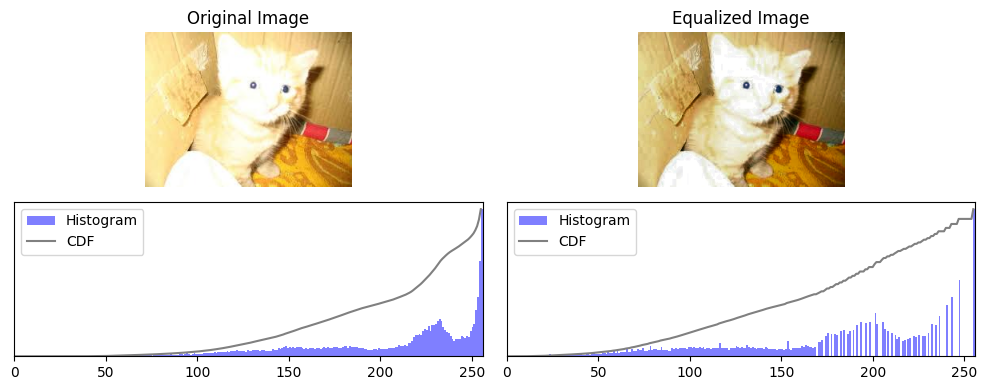

[4.836951595034569, 4.414538101651572]
[5.262694435964914, 5.092544326964098]
[5.402348331045862, 5.348287853430733]
[5.431478241101162, 5.461602594157661]
alpha: 0.5793343737218491


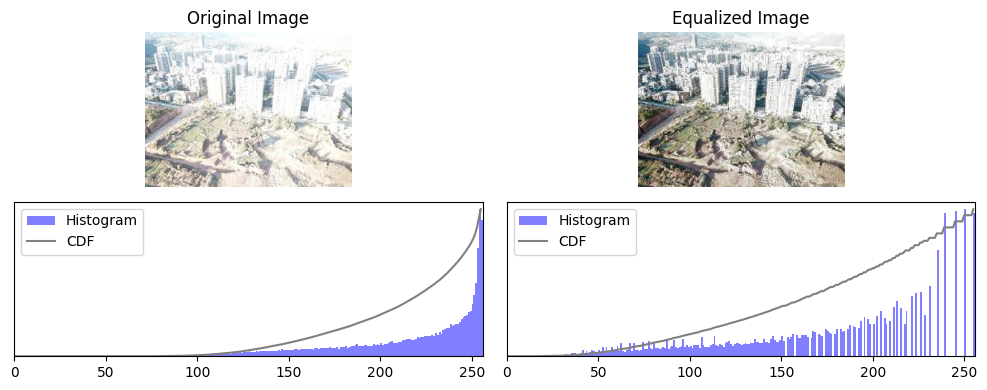

[4.8300304440153505, 4.43571992509925]
[5.138909445897783, 5.109951737232427]
[5.249496949921464, 5.24974388132824]
[5.221022040281184, 5.252117130736535]
alpha: 0.5252316267046729


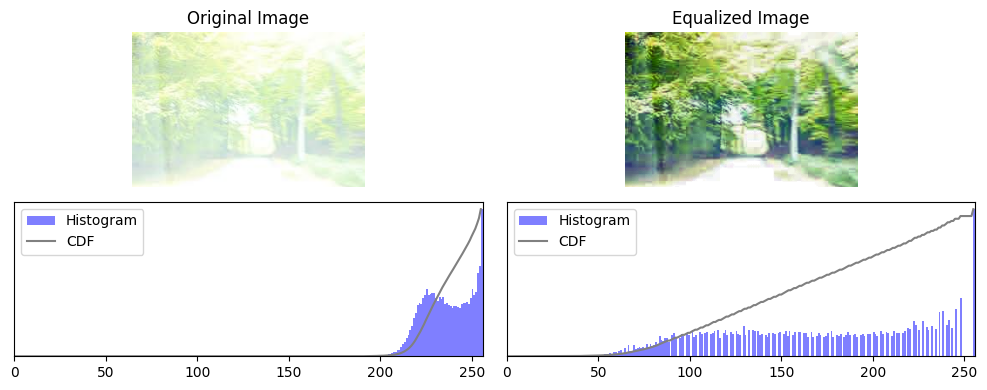

[3.4773510099974345, 2.8902722384055406]
[4.107591759526647, 3.8228313246793086]
[4.328318748804904, 4.169782292771997]
[4.427294033751703, 4.377107905555749]
alpha: 0.587227724755327


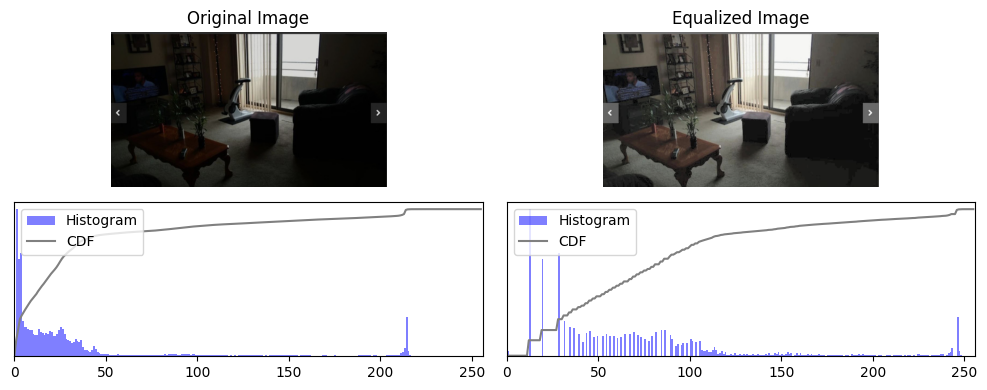

[4.272543798522809, 3.7526073248799605]
[4.8836819048928914, 4.691482244105239]
[5.0732924848428365, 4.992096446965868]
[5.0644220370823065, 5.037486819550076]
alpha: 0.587227724755327


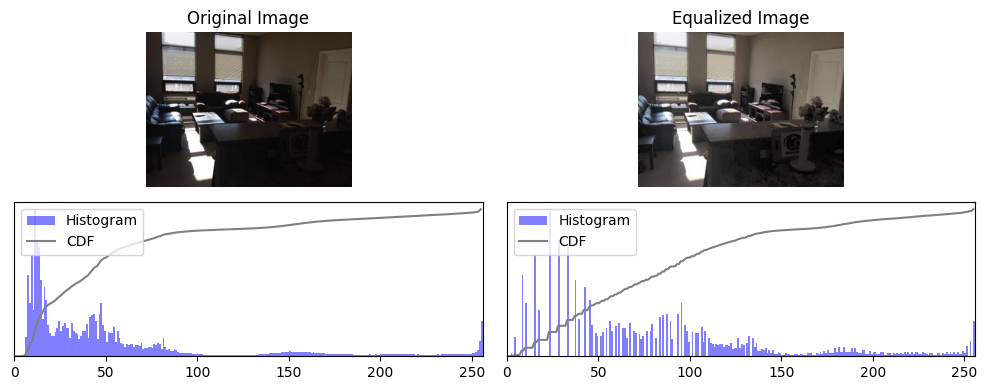

[4.076876161968101, 3.5253812280682992]
[4.6580033275420325, 4.446358200227824]
[4.865556956342488, 4.788708032594635]
[4.943784675282205, 4.917980249832506]
alpha: 0.587227724755327


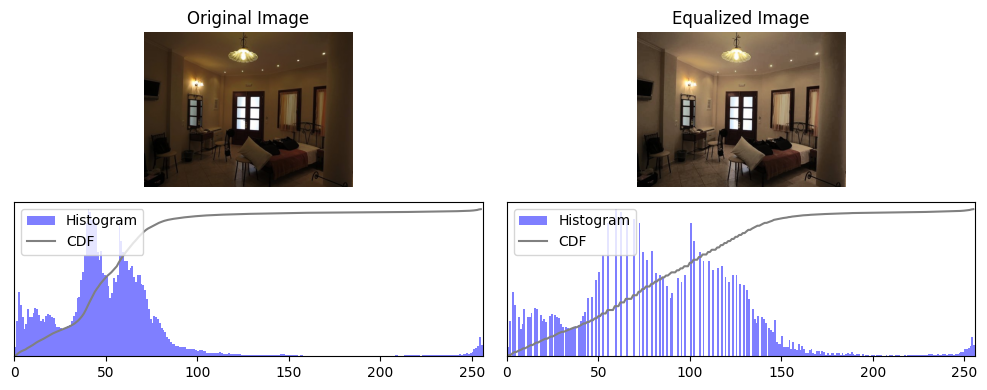

[4.493764712764707, 3.965357072003863]
[5.0510729291540235, 4.798184665021117]
[5.244018559951017, 5.160214718519351]
[5.327811440667204, 5.300282454060102]
alpha: 0.587227724755327


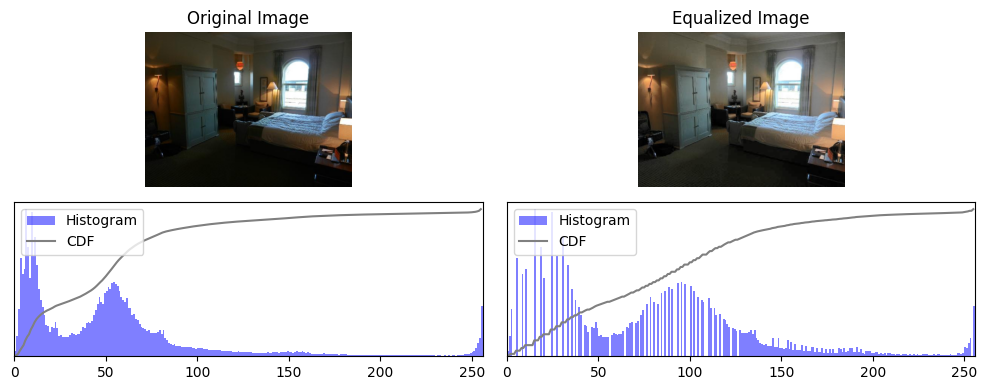

In [ ]:
method = 'HEMIC'

ENTR[method] = []
CCON[method] = []
VIF[method] = []
BRIG[method] = []
images_holder[method] = []

for image in images_holder['Original']:

  # convert equalized to RGB
  equalized_image = hemic(image, 4)

  # Plot result
  plot_HE_result_ycbcr(image, equalized_image)

  # Record result
  images_holder[method].append(equalized_image)

  ccon1 = c_contrast(equalized_image)
  CCON[method].append(ccon1)

  ent1 = calculate_entropy(equalized_image)
  ENTR[method].append(ent1)

  vif1 = vifp(image, equalized_image)
  VIF[method].append(vif1)

  brig = calculate_absolute_brightness(equalized_image)
  BRIG[method].append(brig)

### Result plotting

In [ ]:
import pandas as pd
#Print contrast

df1 = pd.DataFrame(CCON)

# Changing the index from 0-7 to 'sample 01' to 'sample 08'
df1.index = [f'sample {i:02d}' for i in range(1, 9)]

average_df1 = df1.mean()
df1.loc['Average'] = average_df1

# Printing the DataFrame with updated index
print(df1)

           Original        HE       DHE     CLAHE     HEMIC
sample 01  0.097846  0.362732  0.335014  0.212031  0.255296
sample 02  0.187077  0.286236  0.291044  0.219567  0.235950
sample 03  0.155791  0.296184  0.311481  0.259051  0.232965
sample 04  0.050728  0.291012  0.305870  0.130923  0.220827
sample 05  0.217315  0.275291  0.238506  0.239217  0.242617
sample 06  0.239899  0.282863  0.220647  0.244017  0.246254
sample 07  0.147291  0.286844  0.245791  0.179285  0.194651
sample 08  0.203313  0.283941  0.293567  0.226885  0.228156
Average    0.162408  0.295638  0.280240  0.213872  0.232090


In [ ]:
#Print fidelity
df2 = pd.DataFrame(VIF)

# Changing the index from 0-7 to 'sample 01' to 'sample 08'
df2.index = [f'sample {i:02d}' for i in range(1, 9)]

average_df2 = df2.mean()
df2.loc['Average'] = average_df2

# Printing the DataFrame with updated index
print(df2)

                 HE       DHE     CLAHE     HEMIC
sample 01  0.684993  0.907576  1.011435  0.996576
sample 02  0.602677  0.594794  0.676778  0.823064
sample 03  0.464329  0.466136  0.717389  0.673753
sample 04  0.934455  0.856789  0.980811  1.437928
sample 05  0.827237  0.732090  1.027764  0.984197
sample 06  0.840363  0.793772  1.008290  0.954558
sample 07  0.897564  0.799884  0.979104  0.969137
sample 08  0.800913  0.694479  0.922640  0.947604
Average    0.756566  0.730690  0.915526  0.973352


In [ ]:
#Print Entropy
df3 = pd.DataFrame(ENTR)

# Changing the index from 0-7 to 'sample 01' to 'sample 08'
df3.index = [f'sample {i:02d}' for i in range(1, 9)]

average_df3 = df3.mean()
df3.loc['Average'] = average_df3

# Printing the DataFrame with updated index
print(df3)

           Original        HE       DHE     CLAHE     HEMIC
sample 01  4.779825  5.390301  5.420485  5.590692  5.609816
sample 02  6.635927  6.969341  6.800238  7.216181  7.274744
sample 03  6.597681  7.499548  7.340524  7.493061  7.454289
sample 04  5.636766  7.460069  7.383698  6.870802  7.500523
sample 05  5.972549  6.846605  6.374378  7.147518  6.739016
sample 06  6.724720  7.274216  6.897176  7.379820  7.217507
sample 07  6.393037  7.480519  7.333084  7.311616  7.213852
sample 08  6.788822  7.446258  7.230364  7.467810  7.344191
Average    6.191166  7.045857  6.847493  7.059687  7.044242


In [ ]:
#Print relative entropy
# Creating a new DataFrame where each row is divided by the first column
df_3_new = df3.div(df3.iloc[:, 0], axis=0)

# Displaying the new DataFrame
print(df_3_new)

           Original        HE       DHE     CLAHE     HEMIC
sample 01       1.0  1.127719  1.134034  1.169644  1.173645
sample 02       1.0  1.050244  1.024761  1.087441  1.096266
sample 03       1.0  1.136695  1.112592  1.135711  1.129835
sample 04       1.0  1.323466  1.309917  1.218926  1.330643
sample 05       1.0  1.146346  1.067279  1.196728  1.128332
sample 06       1.0  1.081713  1.025645  1.097417  1.073280
sample 07       1.0  1.170104  1.147042  1.143684  1.128392
sample 08       1.0  1.096841  1.065040  1.100016  1.081806
Average         1.0  1.138050  1.106010  1.140284  1.137789


In [ ]:
#Print brightness
df4 = pd.DataFrame(BRIG)

# Changing the index from 0-7 to 'sample 01' to 'sample 08'
df4.index = [f'sample {i:02d}' for i in range(1, 9)]

average_df4 = df4.mean()
df4.loc['Average'] = average_df4

# Printing the DataFrame with updated index
print(df4)

             Original          HE         DHE       CLAHE       HEMIC
sample 01  234.941325  147.305192  177.967624  209.165277  185.327754
sample 02  189.637185  118.298113  128.323926  172.633682  157.016360
sample 03  215.779047  129.030450  135.060502  179.503821  172.481849
sample 04  233.296334  128.249061  131.174466  204.128008  161.285286
sample 05   35.752107  130.339545  113.900420   63.362235   76.855059
sample 06   53.883476  128.105832   77.991201   74.834449   84.058467
sample 07   45.793529  122.259189   90.738712   77.000062   76.895856
sample 08   51.381474  126.830282   88.832118   78.476783   82.143707
Average    132.558060  128.802208  117.998621  132.388040  124.508042


In [ ]:
def plot_images_grid(image_dict):
    num_methods = len(image_dict)
    num_images = len(next(iter(image_dict.values())))  # Assuming all lists have the same number of images

    fig, axes = plt.subplots(num_images, num_methods, figsize=(4 * num_methods, 4 * num_images))

    # Set the column titles to the keys of the dictionary with a larger font size
    for i, (method_name, images) in enumerate(image_dict.items()):
        axes[0, i].set_title(method_name, fontsize=24)  # Adjust the fontsize as needed

        for j in range(num_images):
            ax = axes[j, i]
            ax.imshow(images[j])
            ax.set_xticks([])
            ax.set_yticks([])

                    # Remove the border (spines)
            for spine in ax.spines.values():
              spine.set_visible(False)

            # Add multiple scores below each image
            if method_name == 'Original':
              ent = ENTR['Original'][j]
              cco = CCON['Original'][j]
              brig = BRIG['Original'][j]
              ax.set_xlabel(f'Contrast: {cco:.2f}, Entropy: {ent:.2f}, \nBrightness: {brig:.2f}', fontsize=12)

            else:
              ccon_score = CCON[method_name][j]
              vif_score = VIF[method_name][j]
              entropy_score = ENTR[method_name][j] / ENTR['Original'][j]
              brig1 = BRIG[method_name][j]
              ax.set_xlabel(f'Contrast: {ccon_score:.2f}, Entropy %: {entropy_score:.2f}, \n Brightness: {brig1:.2f}, VIF: {vif_score:.2f}', fontsize=12)

    plt.tight_layout(h_pad=-30)
    plt.show()


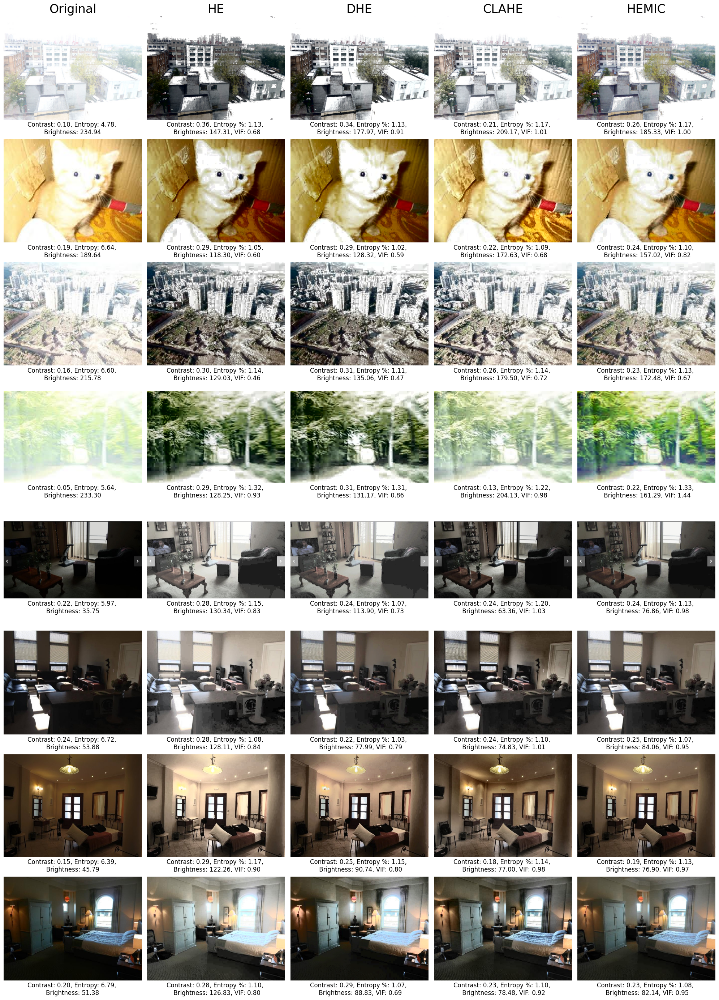

In [ ]:
plot_images_grid(images_holder)

In [ ]:
import matplotlib.pyplot as plt

def haha1(image_dict, method_name, image_number):
    # Ensure the specified method exists in the dictionary
    if method_name not in image_dict:
        raise ValueError(f"Method '{method_name}' not found in image_dict.")

    # Ensure the image number is within the valid range
    num_images = len(image_dict[method_name])
    if not (0 <= image_number < num_images):
        raise ValueError(f"Image number '{image_number}' is out of range. Must be between 0 and {num_images - 1}.")

    fig, ax = plt.subplots(1, 1, figsize=(4, 4))

    # Display the specific image
    ax.imshow(image_dict[method_name][image_number])
    ax.set_xticks([])
    ax.set_yticks([])

    # Remove the border (spines)
    for spine in ax.spines.values():
        spine.set_visible(False)

    # Add multiple scores below the image
    if method_name == 'Original':
        ent = ENTR['Original'][image_number]
        cco = CCON['Original'][image_number]
        brig = BRIG['Original'][image_number]
        ax.set_xlabel(f'Contrast: {cco:.2f}, Entropy: {ent:.2f}, \nBrightness: {brig:.2f}', fontsize=12)
    else:
        ccon_score = CCON[method_name][image_number]
        vif_score = VIF[method_name][image_number]
        entropy_score = ENTR[method_name][image_number] / ENTR['Original'][image_number]
        brig1 = BRIG[method_name][image_number]
        ax.set_xlabel(f'Contrast: {ccon_score:.2f}, Entropy %: {entropy_score:.2f}, \n Brightness: {brig1:.2f}, VIF: {vif_score:.2f}', fontsize=12)

    plt.tight_layout()
    plt.show()


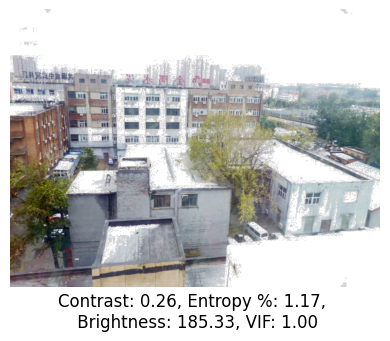

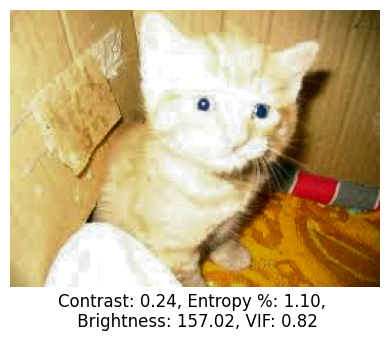

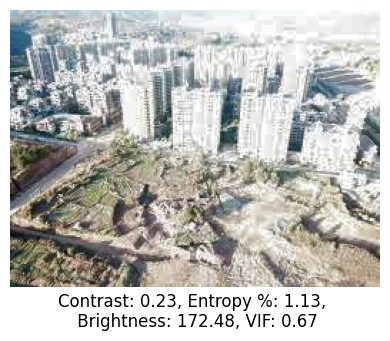

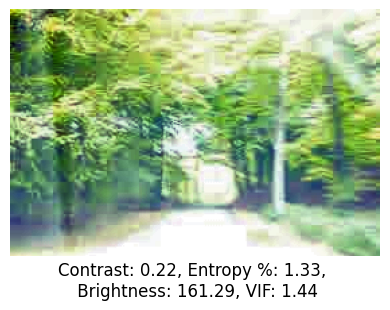

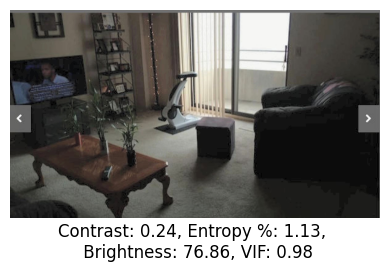

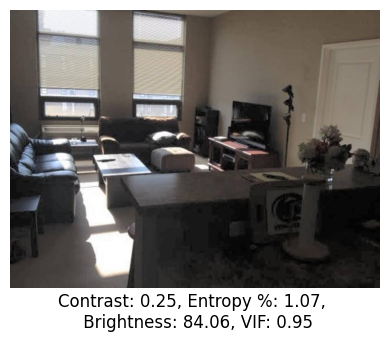

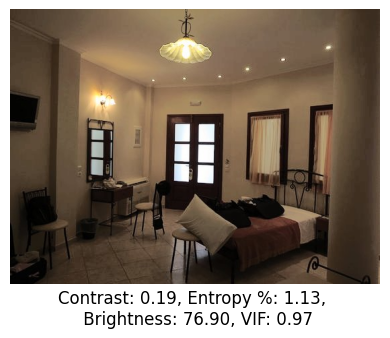

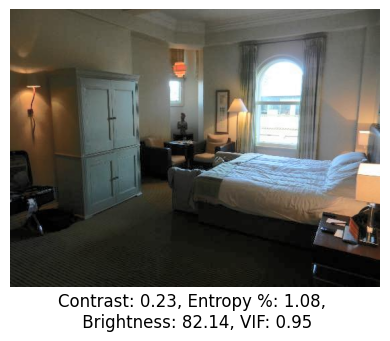

In [ ]:
for i in range(8):
  haha1(images_holder,'HEMIC', i)